In [2]:
from Models.AEmodels import *

In [29]:
# -*- coding: utf-8 -*-
"""
Created on Wed Apr 10 16:14:32 2024

Example of Main Steps for the Detection of HPilory using AutoEncoders for
the detection of anomalous pathological staining

Guides: 
    1. Split into train and test steps 
    2. Save trainned models and any intermediate result input of the next step
    
@authors: debora gil, pau cano
email: debora@cvc.uab.es, pcano@cvc.uab.es
Reference: https://arxiv.org/abs/2309.16053 

"""
# IO Libraries
import sys
import os
import pickle

# Standard Libraries
import numpy as np
import pandas as pd
import glob

# Torch Libraries
from torch.utils.data import DataLoader
import gc
import torch
import torch.nn as nn
import torch.optim as optim
# import wandb



## Own Functions
from Models.AEmodels import AutoEncoderCNN
from Models.datasets import Standard_Dataset
from loadCropped import loadCropped
from loadannotated import loadAnnotated
from reconstructionerror import *


# wandb.login(key="8e9b2ed0a8b812e7888f16b3aa28491ba440d81a")

# wandb.init(project="PSIV 3", config={"batch_size":512}, dir="./wandb")



net_paramsEnc = {"drop_rate": 0}
net_paramsDec = {}
inputmodule_paramsDec = {}
def AEConfigs(Config):

    if Config=='1':
        # CONFIG1
        net_paramsEnc['block_configs']=[[32,32],[64,64]]
        net_paramsEnc['stride']=[[1,2],[1,2]]
        net_paramsDec['block_configs']=[[64,32],[32,inputmodule_paramsEnc['num_input_channels']]]
        net_paramsDec['stride']=net_paramsEnc['stride']
        net_paramsEnc["drop_rate"] = 0.2
        net_paramsDec["drop_rate"] = 0.2
        inputmodule_paramsDec['num_input_channels']=net_paramsEnc['block_configs'][-1][-1]



    elif Config=='2':
        # CONFIG 2
        net_paramsEnc['block_configs']=[[32],[64],[128],[256]]
        net_paramsEnc['stride']=[[2],[2],[2],[2]]
        net_paramsDec['block_configs']=[[128],[64],[32],[inputmodule_paramsEnc['num_input_channels']]]
        net_paramsDec['stride']=net_paramsEnc['stride']
        inputmodule_paramsDec['num_input_channels']=net_paramsEnc['block_configs'][-1][-1]


    elif Config=='3':
        # CONFIG3
        net_paramsEnc['block_configs']=[[32],[64],[64]]
        net_paramsEnc['stride']=[[1],[2],[2]]
        net_paramsDec['block_configs']=[[64],[32],[inputmodule_paramsEnc['num_input_channels']]]
        net_paramsDec['stride']=net_paramsEnc['stride']
        inputmodule_paramsDec['num_input_channels']=net_paramsEnc['block_configs'][-1][-1]

    return net_paramsEnc,net_paramsDec,inputmodule_paramsDec


######################### 0. EXPERIMENT PARAMETERS
# 0.1 AE PARAMETERS
inputmodule_paramsEnc={}
inputmodule_paramsEnc['num_input_channels']=3





# 1.2 Patches Data




#### 2. DATA SPLITING INTO INDEPENDENT SETS

# 2.0 Annotated set for FRed optimal threshold


# 2.1 AE trainnig set





# 2.1 Diagosis crossvalidation set

#### 3. lOAD PATCHES

### 4. AE TRAINING

# EXPERIMENTAL DESIGN:
# TRAIN ON AE PATIENTS AN AUTOENCODER, USE THE ANNOTATED PATIENTS TO SET THE
# THRESHOLD ON FRED, VALIDATE FRED FOR DIAGNOSIS ON A 10 FOLD SCHEME OF REMAINING
# CASES.

# 4.1 Data Split
print("CREANT MODEL")
###### CONFIG1
Config='1'
net_paramsEnc,net_paramsDec,inputmodule_paramsDec = AEConfigs(Config)
model=AutoEncoderCNN(inputmodule_paramsEnc, net_paramsEnc,
                     inputmodule_paramsDec, net_paramsDec)

CREANT MODEL


In [30]:
import torch
from torchvision import transforms
import cv2
import matplotlib.pyplot as plt

# Step 1: Load the pre-trained model
net_paramsEnc, net_paramsDec, inputmodule_paramsDec = AEConfigs(Config)
model = AutoEncoderCNN(inputmodule_paramsEnc, net_paramsEnc,
                       inputmodule_paramsDec, net_paramsDec)
model.load_state_dict(torch.load('model_rapid_nou.pth'))
model.eval()  # Set the model to evaluation mode


AutoEncoderCNN(
  (encoder): Encoder(
    (encoder): Sequential(
      (cnnblock1): _CNNBlock(
        (cnnlayer1): _CNNLayer(
          (cnn_layer): Sequential(
            (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): LeakyReLU(negative_slope=0.01, inplace=True)
            (3): Dropout(p=0.2, inplace=False)
          )
        )
        (cnnlayer2): _CNNLayer(
          (cnn_layer): Sequential(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): LeakyReLU(negative_slope=0.01, inplace=True)
            (3): Dropout(p=0.2, inplace=False)
          )
        )
      )
      (cnnblock2): _CNNBlock(
        (cnnlayer1): _CNNLayer(
          (cnn_layer): Sequential(
            (0): Conv2d(32, 64, kernel_size=(

Reconstruction Error (average): 93.32341766357422
F_red: 0.9056114055931274


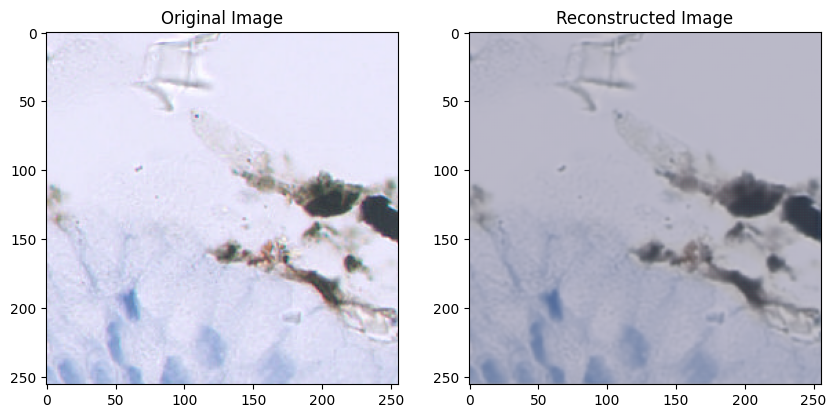

In [ ]:
import torch
import cv2
import numpy as np
from torchvision import transforms
import matplotlib.pyplot as plt
from PIL import Image

# Step 1: Load and preprocess the input image
image_path = '15.png'
input_image = cv2.imread(image_path)  # Read the image
input_image = cv2.cvtColor(input_image, cv2.COLOR_BGR2RGB)  # Convert to RGB format

# Convert the image to float32 and normalize to [0, 1]
input_image = input_image.astype(np.float32) / 255.0  

# Convert image to a PIL Image (needed for transforms)
input_image_pil = Image.fromarray((input_image * 255).astype(np.uint8))

# Define the transform (ToTensor will normalize the image)
transform = transforms.Compose([
    transforms.ToTensor()  # Converts image to tensor and scales it to [0, 1]
])

# Apply the transformations
input_tensor = transform(input_image_pil).unsqueeze(0)  # Add batch dimension

# Step 2: Load the model and pass the image through it
model.eval()  # Set model to evaluation mode
with torch.no_grad():  # No need to track gradients for inference
    output_tensor = model(input_tensor)

# Step 3: Postprocess the output (convert back to image format)
# Convert tensor to numpy and reverse the ToTensor() normalization
output_image = output_tensor.squeeze(0).detach().cpu().numpy()  # Remove batch dimension
output_image = np.transpose(output_image, (1, 2, 0))  # Convert to HWC format

# Step 4: Compute F_red
f_red = calculate_f_red(input_image, output_image, threshold_low=-20, threshold_high=20)
print(f"F_red: {f_red}")

# Step 4: Display the original and output images
plt.figure(figsize=(10, 5))

# Original Image
plt.subplot(1, 2, 1)
plt.imshow(input_image)
plt.title('Original Image')

# Reconstructed Image
plt.subplot(1, 2, 2)
plt.imshow(output_image)
plt.title('Reconstructed Image')

plt.show()


In [34]:
ListFolders = glob.glob("Annotated/*")
patientsImgs, patientsMeta = loadAnnotated(ListFolders, 70)

No matching Window_ID for image '00498.png' in Excel data. Skipping.
No matching Window_ID for image '00498.png' in Excel data. Skipping.
No matching Window_ID for image '00498.png' in Excel data. Skipping.
No matching Window_ID for image '00498.png' in Excel data. Skipping.
No matching Window_ID for image '00513.png' in Excel data. Skipping.
No matching Window_ID for image '00185.png' in Excel data. Skipping.
No matching Window_ID for image '00477.png' in Excel data. Skipping.
No matching Window_ID for image '00513.png' in Excel data. Skipping.
No matching Window_ID for image '00611.png' in Excel data. Skipping.
No matching Window_ID for image '00611.png' in Excel data. Skipping.
No matching Window_ID for image '00636.png' in Excel data. Skipping.
No matching Window_ID for image '00513.png' in Excel data. Skipping.
No matching Window_ID for image '00611.png' in Excel data. Skipping.
No matching Window_ID for image '00513.png' in Excel data. Skipping.
No matching Window_ID for image '0

Image: [[[227 203 176]
  [226 206 182]
  [223 194 186]
  ...
  [235 212 208]
  [238 211 210]
  [238 211 210]]

 [[235 208 193]
  [233 205 193]
  [228 201 192]
  ...
  [240 217 212]
  [241 215 214]
  [243 216 217]]

 [[243 208 206]
  [241 205 203]
  [235 211 198]
  ...
  [250 226 222]
  [248 222 222]
  [249 222 225]]

 ...

 [[229 200 194]
  [229 201 194]
  [231 204 196]
  ...
  [240 218 217]
  [238 218 214]
  [238 220 212]]

 [[230 203 197]
  [231 201 197]
  [233 202 198]
  ...
  [240 218 217]
  [238 216 213]
  [237 216 210]]

 [[232 205 200]
  [233 201 199]
  [234 199 200]
  ...
  [242 219 221]
  [241 217 217]
  [241 217 215]]]
Reconstruction Error (average): 99.51080322265625
F_red: 0.6635800988341409
Image: [[[227 203 176]
  [226 206 182]
  [223 194 186]
  ...
  [235 212 208]
  [238 211 210]
  [238 211 210]]

 [[235 208 193]
  [233 205 193]
  [228 201 192]
  ...
  [240 217 212]
  [241 215 214]
  [243 216 217]]

 [[243 208 206]
  [241 205 203]
  [235 211 198]
  ...
  [250 226 222]
  

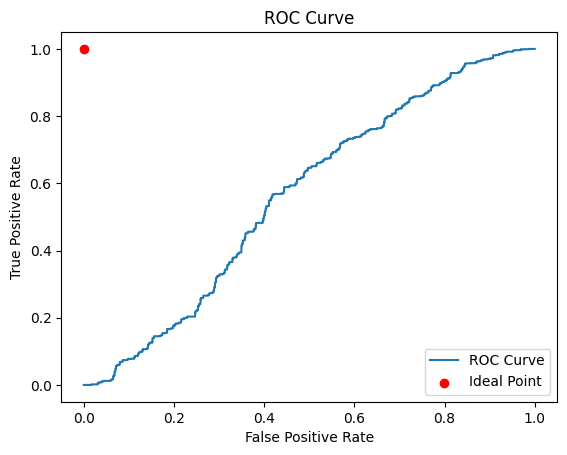

In [ ]:
import os
import torch
from torchvision import transforms
import cv2
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
from sklearn.metrics import roc_curve

# Step 1: Load the pre-trained model
# Supongamos que AEConfigs y AutoEncoderCNN ya están definidos en tu entorno
net_paramsEnc, net_paramsDec, inputmodule_paramsDec = AEConfigs(Config)
model = AutoEncoderCNN(inputmodule_paramsEnc, net_paramsEnc,
                       inputmodule_paramsDec, net_paramsDec)
model.load_state_dict(torch.load('model_rapid_nou.pth'))
model.eval()  # Set the model to evaluation mode

# Step 2: Define transformations and initialize variables
transform = transforms.Compose([transforms.ToTensor()])
errors = []  # List to store reconstruction errors
labels = []  # List to store true labels

# Process each image and compute F_red
for input_image, metadata in zip(patientsImgs, patientsMeta):
    pat_id, img_window_id, label = metadata

    input_image = cv2.cvtColor(input_image, cv2.COLOR_BGR2RGB)  # Convert to RGB format
    input_image = input_image.astype(np.float32) / 255.0  # Normalize to [0, 1]
    input_image_pil = Image.fromarray((input_image * 255).astype(np.uint8))

    # Transform image to tensor
    input_tensor = transform(input_image_pil).unsqueeze(0)  # Add batch dimension

    # Pass the image through the model
    with torch.no_grad():
        output_tensor = model(input_tensor)

    # Postprocess the output image
    output_image = output_tensor.squeeze(0).detach().cpu().numpy()  # Remove batch dimension
    output_image = np.transpose(output_image, (1, 2, 0))  # Convert to HWC format
    output_image = (output_image * 255).astype(np.uint8)  # Convert back to uint8

    # Compute F_red
    f_red = calculate_f_red(input_image, output_image, threshold_low=-20, threshold_high=20)
    print(f"F_red: {f_red}")

    # Collect errors and labels for ROC analysis
    errors.append(f_red)
    labels.append(label)  # Use the label extracted from the metadata

# Perform ROC analysis
optimal_threshold, fpr, tpr = roc_threshold_analysis(errors, labels)
print(f"Optimal Threshold: {optimal_threshold}")

# Plot the ROC curve
plt.figure()
plt.plot(fpr, tpr, label="ROC Curve")
plt.scatter([0], [1], color="red", label="Ideal Point")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.show()

In [24]:
print(errors)
print(labels)

[134.43799, 109.50707, 104.65715, 109.6749, 97.489944, 111.26019, 97.13943, 112.329315, 99.5108, 111.25043, 96.553696, 61.499214, 112.04639, 109.08456, 109.294525, 106.23702, 105.8586, 101.70162, 101.87466, 97.89398, 98.33165, 171.78416, 170.00847, 173.25336, 168.32214, 175.08905, 165.76721, 178.3622, 163.4367, 179.36995, 102.0309, 126.49187, 128.47101, 126.36009, 134.05232, 122.663795, 138.32451, 119.42919, 139.0592, 114.85564, 139.42809, 113.295616, 116.03509, 114.09779, 120.71561, 116.80856, 125.76252, 118.893654, 129.34952, 121.90265, 70.07512, 107.75882, 113.47961, 49.188736, 32.204266, 33.115387, 127.210846, 98.00215, 47.948017, 92.17202, 97.000786, 68.88695, 103.41733, 42.913868, 43.24145, 147.30896, 196.93147, 82.9691, 106.58851, 116.866875, 74.92928, 93.78234, 78.70573, 89.005806, 51.180996, 40.655655, 74.31347, 91.41885, 62.99919, 57.578423, 67.87394, 174.31088, 144.74579, 113.74423, 113.46889, 125.208984, 69.2684, 99.318596, 74.21876, 98.166145, 64.93853, 42.2629, 61.141903,